(3280, 2464)


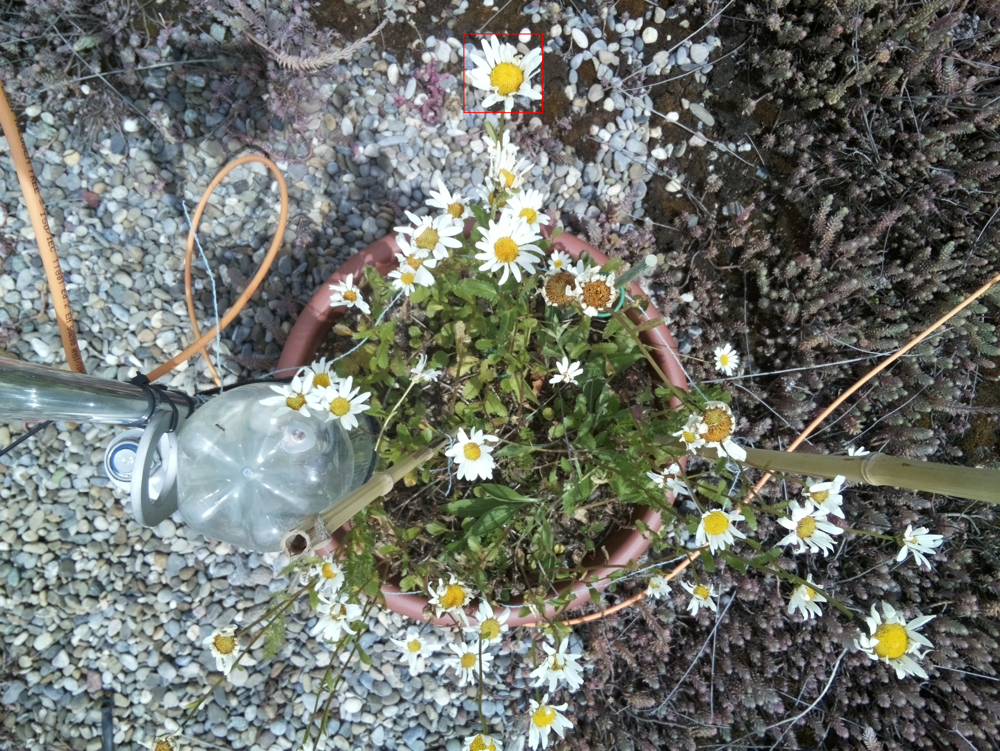

In [17]:
from PIL import Image, ImageDraw

img = Image.open("test.jpg")
W_original, H_original = img.size

w_obj = 260
h_obj = 260
obj_x, obj_y = 1520, 110

img_original = img.copy()
draw_original = ImageDraw.Draw(img_original)
draw_original.rectangle([obj_x, obj_y, obj_x + w_obj, obj_y + h_obj], outline="red", width=3)
print(img_original.size)
img_original

image size:  (640, 640)
object h: 50.73170731707317
object w: 50.73170731707317


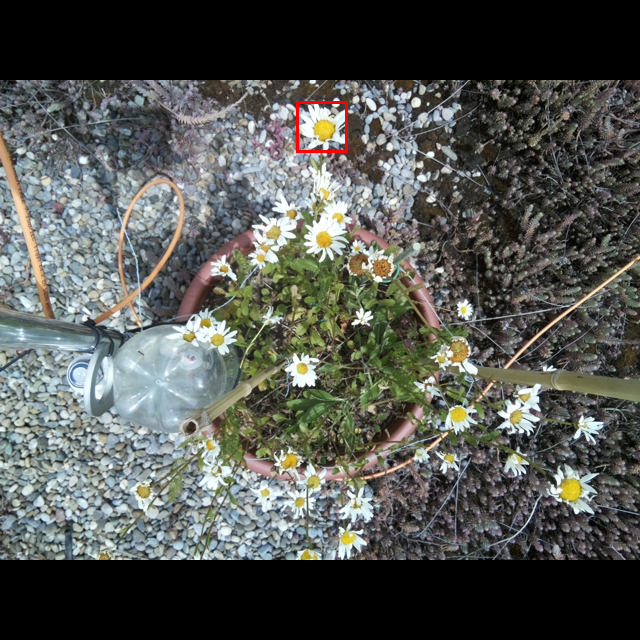

In [16]:
# 640x640 (Letterboxing)

max_dim = 640
scale = min(max_dim / W_original, max_dim / H_original)

new_width = int(W_original * scale)
new_height = int(H_original * scale)

img_letterbox = Image.new("RGB", (640, 640), (0, 0, 0))
img_scaled_ar = img.resize((new_width, new_height))

offset_x = (max_dim - new_width) // 2
offset_y = (max_dim - new_height) // 2
img_letterbox.paste(img_scaled_ar, (offset_x, offset_y))

obj_x_lb = obj_x * scale + offset_x
obj_y_lb = obj_y * scale + offset_y
obj_w_lb = w_obj * scale
obj_h_lb = h_obj * scale

draw_lb = ImageDraw.Draw(img_letterbox)
draw_lb.rectangle([obj_x_lb, obj_y_lb, obj_x_lb + obj_w_lb, obj_y_lb + obj_h_lb], outline="red", width=3)
print("image size: ", img_letterbox.size)
print("object h:", obj_h_lb)
print("object w:", obj_w_lb)
img_letterbox